In [27]:
import numpy as np
import glob
import pandas as pd
pd.set_option('display.max_columns', 200)
import matplotlib.pyplot as plt
import seaborn as sns 
sns.set_style('darkgrid')

import warnings
warnings.filterwarnings("ignore")

from statsmodels.tsa.vector_ar.var_model import VAR
from statsmodels.tsa.statespace.varmax import VARMAX
from sklearn.linear_model import LinearRegression,HuberRegressor
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.svm import SVR
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import ExtraTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from xgboost import plot_importance



# TSA from Statsmodels
import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.tsa.api as smt

%matplotlib inline
plt.rcParams['figure.figsize'] = [16, 6]
%config InlineBackend.figure_format='retina'

In [28]:
df = pd.read_csv(r'C:\Users\u23e00\NOx_prediction\data\raw\complete_data_29_10.csv')
df = df.drop('Unnamed: 0', axis=1)
df['NOx'] = df['GPiS_NO'] + df['GPiS_NO2']
df

,GPiS_NO,AMB_Humidity,AMB_Pressure,AMB_Temperature,EFM_AbsolutePressure,EFM_ExhaustGasDiffPress,EFM_ExhaustGasFlowMass,EFM_ExhaustGasFlowVol,EFM_ExhaustGasTemp,OBD_Accelerator_Pedal_Position_D_(PID_49),OBD_Barometric_Pressure_(PID_33),OBD_Engine_Coolant_Temperature_(PID_05),OBD_Engine_RPM_(PID_0C),OBD_Intake_Air_Temperature_(PID_0F),OBD_Vehicle_Speed_Sensor_(PID_0D),GPiS_NO2,accel,NOx
0,0.514287,31.845775,962.843895,21.151974,984.010010,0.00000,0.02200,0.000000,17.900000,14.9036,96.0,20.0,0.0,22.0,0.0,0.317213,NaN,0.831500
1,0.592000,31.918452,962.843895,21.181047,984.017822,0.00000,0.05398,0.000000,17.978001,14.9036,96.0,20.0,0.0,22.0,0.0,0.326000,0.0,0.918000
2,0.593300,31.894226,962.843895,21.151974,984.100220,0.00000,0.02171,0.000000,18.100000,14.9036,96.0,20.0,0.0,22.0,0.0,0.330225,0.0,0.923525
3,0.595300,31.845775,962.843895,21.122906,984.210022,0.00000,-0.04421,0.000000,18.100000,14.9036,96.0,20.0,0.0,22.0,0.0,0.336725,0.0,0.932025
4,0.596975,31.773098,962.843895,21.093832,984.210022,0.00000,-0.04077,0.000000,18.100000,14.9036,96.0,20.0,0.0,22.0,0.0,0.343225,0.0,0.940200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
496225,0.182830,17.213895,974.436712,16.646320,976.128540,-0.00300,-1.28990,-0.000300,10.400000,14.8998,97.0,17.0,0.0,20.0,0.0,-0.883100,0.0,-0.700270
496226,0.171620,17.190055,974.675131,16.674925,976.190002,-0.00300,-1.38400,-0.000300,10.400000,14.8998,97.0,17.0,0.0,20.0,0.0,-0.878390,0.0,-0.706770
496227,0.160620,17.213895,974.436712,16.674925,976.190002,-0.00300,-1.34970,-0.000300,10.400000,14.8998,97.0,17.0,0.0,20.0,0.0,-0.873890,0.0,-0.713270
496228,0.149330,17.213895,974.675131,16.674925,976.197022,-0.00265,-1.21285,-0.000265,10.400000,14.8998,97.0,17.0,0.0,20.0,0.0,-0.869390,0.0,-0.720060


In [29]:
df = df[(df['GPiS_NO']<2500) &(df['GPiS_NO']>0)][:-2000]

In [30]:
channels_model = ['GPiS_NO','AMB_Humidity', 'AMB_Pressure', 'AMB_Temperature','EFM_ExhaustGasTemp','OBD_Engine_Coolant_Temperature_(PID_05)',
                  'OBD_Engine_RPM_(PID_0C)','OBD_Vehicle_Speed_Sensor_(PID_0D)','accel']

In [31]:
df = df[channels_model].dropna()
df = df[df['OBD_Engine_Coolant_Temperature_(PID_05)']>0]
df

,GPiS_NO,AMB_Humidity,AMB_Pressure,AMB_Temperature,EFM_ExhaustGasTemp,OBD_Engine_Coolant_Temperature_(PID_05),OBD_Engine_RPM_(PID_0C),OBD_Vehicle_Speed_Sensor_(PID_0D),accel
1,0.592000,31.918452,962.843895,21.181047,17.978001,20.0,0.00,0.0,0.0
2,0.593300,31.894226,962.843895,21.151974,18.100000,20.0,0.00,0.0,0.0
3,0.595300,31.845775,962.843895,21.122906,18.100000,20.0,0.00,0.0,0.0
4,0.596975,31.773098,962.843895,21.093832,18.100000,20.0,0.00,0.0,0.0
5,0.598475,31.797323,962.601614,21.122906,18.100000,20.0,0.00,0.0,0.0
...,...,...,...,...,...,...,...,...,...
480447,18.639870,42.341800,976.820755,-4.895972,68.288002,95.0,1215.00,26.0,0.0
480448,17.270870,42.341800,976.820755,-4.867365,68.400002,95.0,1215.00,26.0,0.0
480449,17.113434,42.365642,977.059174,-4.867365,68.400002,95.0,1215.00,26.0,0.0
480450,16.955997,42.341800,976.820755,-4.867365,68.400002,95.0,1215.00,26.0,0.0


In [32]:
# convert time-series data to supervised data
def series_to_supervised(data, n_in, n_out=1, dropnan=True, col_name=df.columns):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = pd.DataFrame(data)
    cols, names = list(), list()
    
    # input sequence (t-n, ... t-1)
    for j in range(0,n_vars):
        for i in range(n_in[j], 0, -1):
            cols.append(df[j].shift(i))
            names += [(str(col_name[j]) + ' %d(t-%d)' % (j+1, i))]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
            names += [(str(col_name[j]) +' %d(t)' % (j+1)) for j in range(n_vars)]
        else:
            names += [(str(col_name[j]) +' %d(t+%d)' % (j+1, i)) for j in range(n_vars)]
    
    # put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg, names

In [33]:
def split_data(data, n_lag, n_features,flag):
    n_obs = sum(n_lag)
    reframed = series_to_supervised(data, n_lag, 1)[0]
    if flag==1 :
        print(reframed.head())
    # split into train and test sets
    values = reframed.values
    n_train = int(train_percent*(len(data)))
    train = values[:n_train, :]
    test = values[n_train:, :]
    # split into input and outputs
    train_X, train_y = train[:, :n_obs], train[:, -n_features]
    test_X, test_y = test[:, :n_obs], test[:, -n_features]
    print(train_X.shape, len(train_X), train_y.shape)
    print(test_X.shape)
    return train_X, train_y, test_X, test_y, series_to_supervised(data, n_lag, 1)[1]

In [34]:
def plot(y1,y2,title):
    x = []
    for i in range(0,len(y1)):
        x.append(i+1)
    plt.plot(x, y1, label = "Actual")   
    plt.plot(x, y2, label = "Predicted", color='C3') 
    plt.xlabel('Index') 
    plt.ylabel('NO Emission (ppm)') 
    plt.title(title) 
    plt.legend()    
    plt.show()

In [35]:
MSE = {}
train_percent =.9

n_lag = 5*(np.ones(df.shape[1]))
n_lag = list(map(int, n_lag))
n_features = df.shape[1]

# n_lag = []
# n_features = df.shape[1]
# for i in range(0,n_features):
#     if i%2==0:
#         n_lag.append(2)
#     else:
#         n_lag.append(3)

In [36]:
def xgb(data, n_lag, n_features,flag):
    # Fit Linear Regression
    train_X, train_y, test_X, test_y, columns = split_data(data, n_lag, n_features,flag)
    # include or exclude NO
#     train_X = pd.DataFrame(train_X).drop([0,1], axis=1).values
#     test_X = pd.DataFrame(test_X).drop([0,1], axis=1).values
    print("new_train shape :",len(train_X[0]))
    model = XGBRegressor(n_estimators=100)
    model.fit(train_X, train_y)
    prediction = model.predict(test_X)
    mse = np.sqrt(mean_squared_error(prediction, test_y))
    return prediction, mse,test_y, model,train_X,test_X, columns

   GPiS_NO 1(t-5)  GPiS_NO 1(t-4)  GPiS_NO 1(t-3)  GPiS_NO 1(t-2)  \
5        0.592000        0.593300        0.595300        0.596975   
6        0.593300        0.595300        0.596975        0.598475   
7        0.595300        0.596975        0.598475        0.600300   
8        0.596975        0.598475        0.600300        0.602300   
9        0.598475        0.600300        0.602300        0.604300   

   GPiS_NO 1(t-1)  AMB_Humidity 2(t-5)  AMB_Humidity 2(t-4)  \
5        0.598475            31.918452            31.894226   
6        0.600300            31.894226            31.845775   
7        0.602300            31.845775            31.773098   
8        0.604300            31.773098            31.797323   
9        0.606300            31.797323            31.845775   

   AMB_Humidity 2(t-3)  AMB_Humidity 2(t-2)  AMB_Humidity 2(t-1)  \
5            31.845775            31.773098            31.797323   
6            31.773098            31.797323            31.845775   
7 

new_train shape : 45


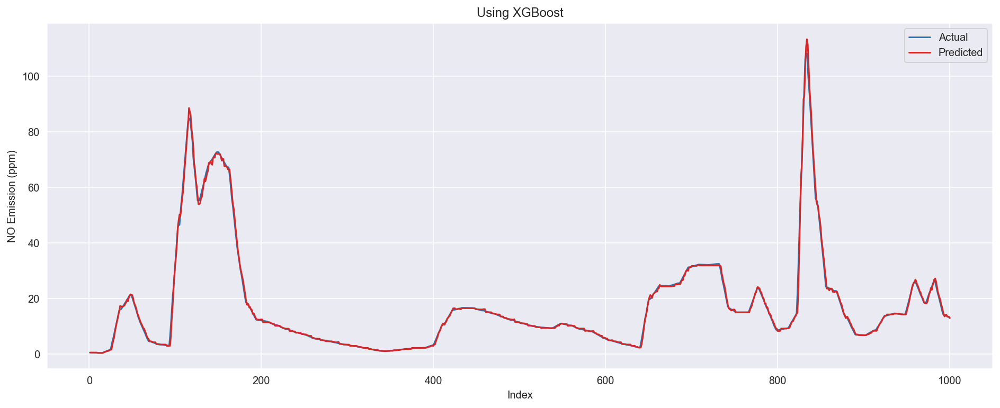

In [37]:
prediction_xgb, MSE['XGB'],test_xgb, model_xgb_l5, train_X,test_X, columns = xgb(df.values, n_lag, n_features, 1)
plot(test_xgb[5000:6000], prediction_xgb[5000:6000], 'Using XGBoost')

In [39]:
np.sqrt(mean_squared_error(prediction_xgb, test_xgb))

2.881303538974755

In [14]:
from xgboost import plot_importance
# plot feature importance
# model_xgb.get_booster().feature_names = columns
# plt.figure(figsize=(15,8))
# plot_importance(model_xgb, max_num_features = 25);

In [15]:
# prediction_xgb, MSE['XGB'],test_xgb, model_xgb, train_X,test_X, columns = xgb(df.values, n_lag, n_features, 1)
# plot(test_xgb, prediction_xgb, 'Using XGBoost')

## Prediction and feature importance WITHOUT NO at different lags

In [16]:
def feat_imp(model, columns):
    model.get_booster().feature_names = columns
    fig, ax = plt.subplots(figsize=(15,5))
    plot_importance(model, max_num_features=15, height=0.8, ax=ax)
    plt.show()

In [17]:
def xgb_without_no(data, n_lag, n_features,lag,flag):
    # Fit Linear Regression
    train_X, train_y, test_X, test_y, columns = split_data(data, n_lag, n_features,flag)
    # exclude NO
#     print(pd.DataFrame(train_X).head())
    train_X = pd.DataFrame(train_X).drop(np.arange(lag), axis=1).values
#     print(pd.DataFrame(train_X).head())
    test_X = pd.DataFrame(test_X).drop(np.arange(lag), axis=1).values
    print("new_train shape :",len(train_X[0]))
    model = XGBRegressor(n_estimators=100)
    model.fit(train_X, train_y)
    prediction = model.predict(test_X)
    mse = np.sqrt(mean_squared_error(prediction, test_y))
    columns = columns[lag:]
    return prediction, mse,test_y, model,train_X,test_X, columns

In [18]:
def pred_feat_without_nox(lag,df):
    for i in range(lag):
        n_lag_t = i+1*(np.ones(df.shape[1]))
        n_lag_t = list(map(int, n_lag_t))
        n_features_t = df.shape[1]
        prediction_xgb, MSE['XGB'],test_xgb, model_xgb, train_X,test_X, columns = xgb_without_no(df.values, n_lag_t, n_features_t,i+1,0)
        plot(test_xgb, prediction_xgb, 'prediction using XGBoost at Lag t-'+str(i+1));
        print('RMSE : ', np.sqrt(mean_squared_error(prediction_xgb, test_xgb)))
        feat_imp(model_xgb, columns);

(417152, 9) 417152 (417152,)
(46350, 9)
new_train shape : 8


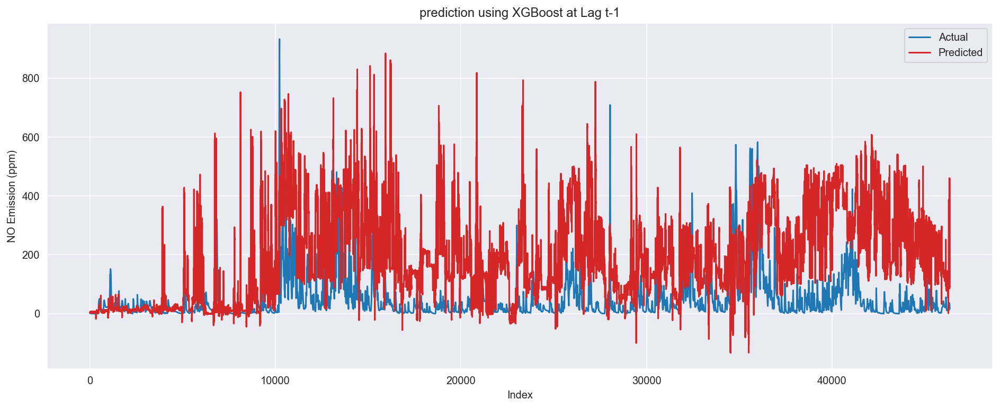

RMSE :  189.53507381714988


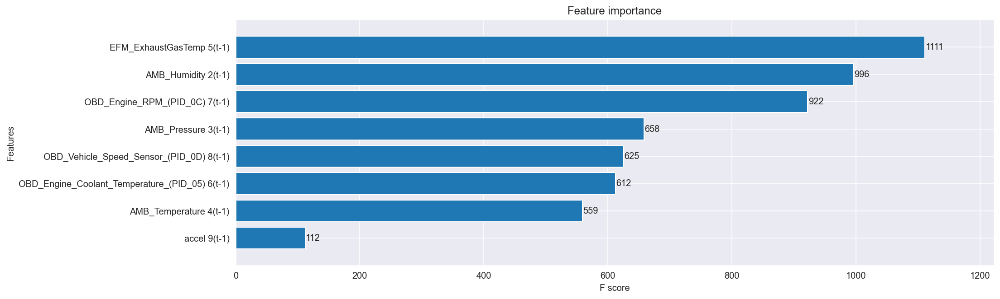

(417152, 18) 417152 (417152,)
(46349, 18)
new_train shape : 16


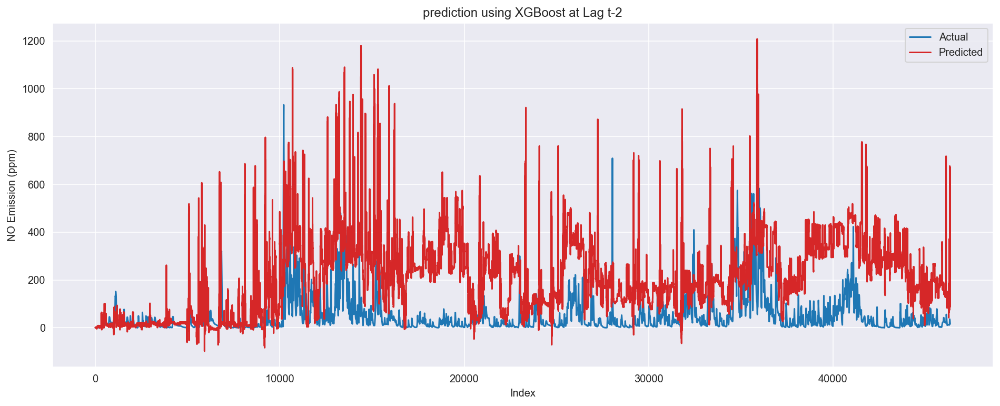

RMSE :  205.96744585296642


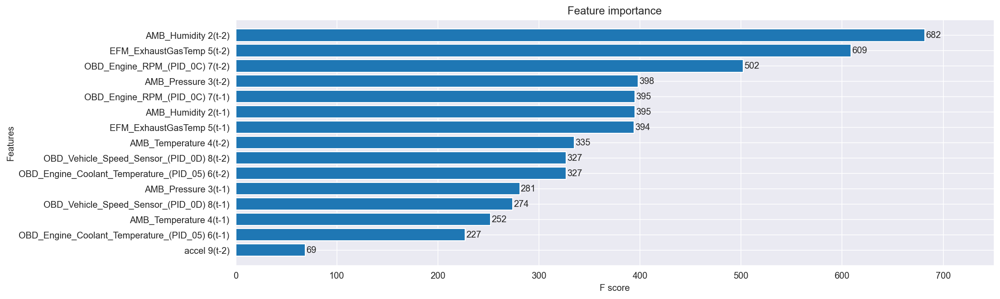

(417152, 27) 417152 (417152,)
(46348, 27)
new_train shape : 24


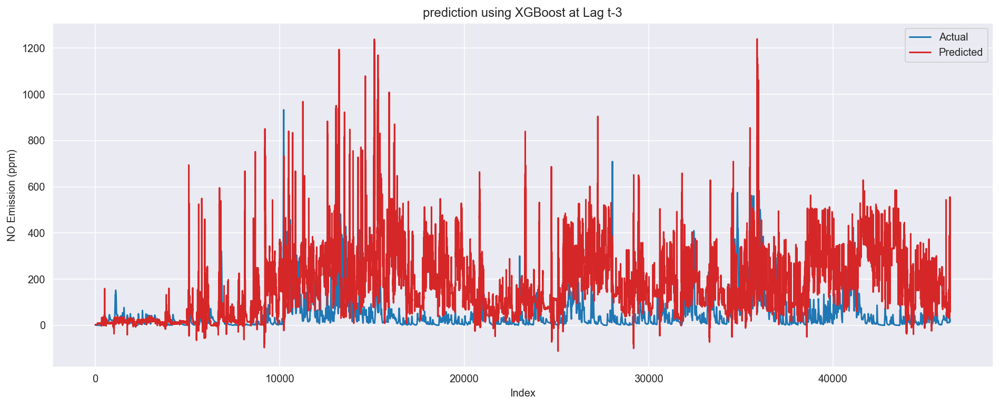

RMSE :  175.76928584017395


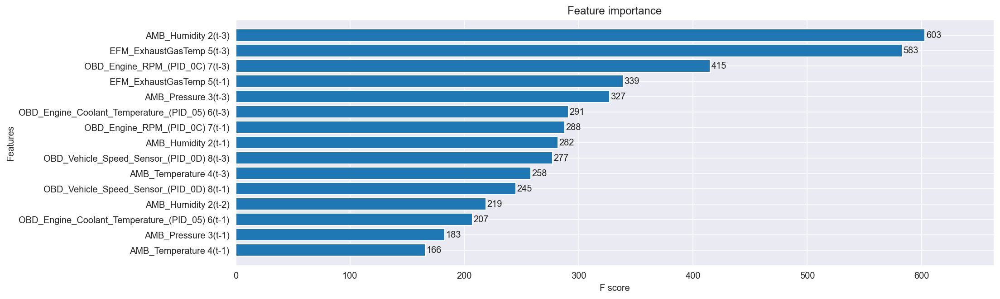

(417152, 36) 417152 (417152,)
(46347, 36)
new_train shape : 32


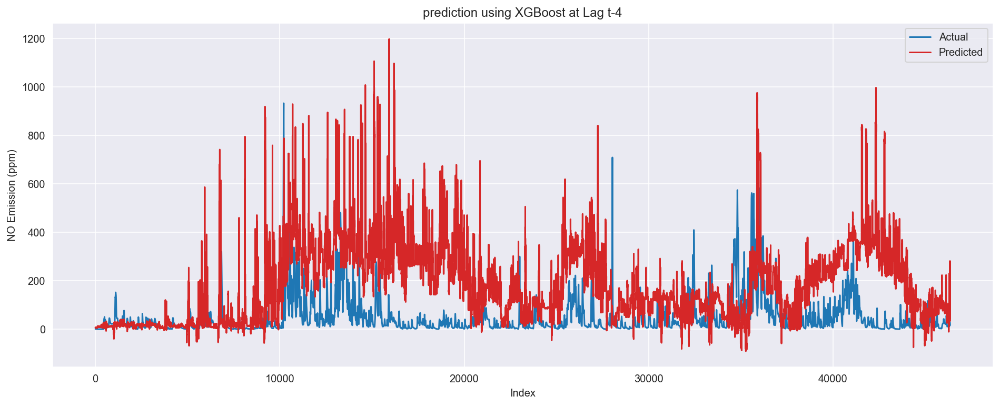

RMSE :  187.0043950559742


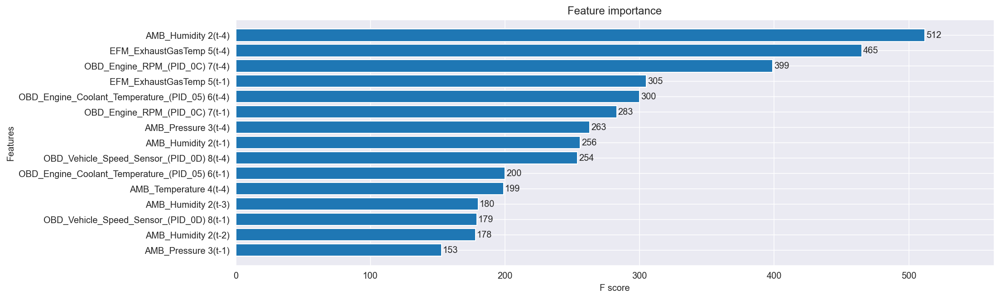

(417152, 45) 417152 (417152,)
(46346, 45)
new_train shape : 40


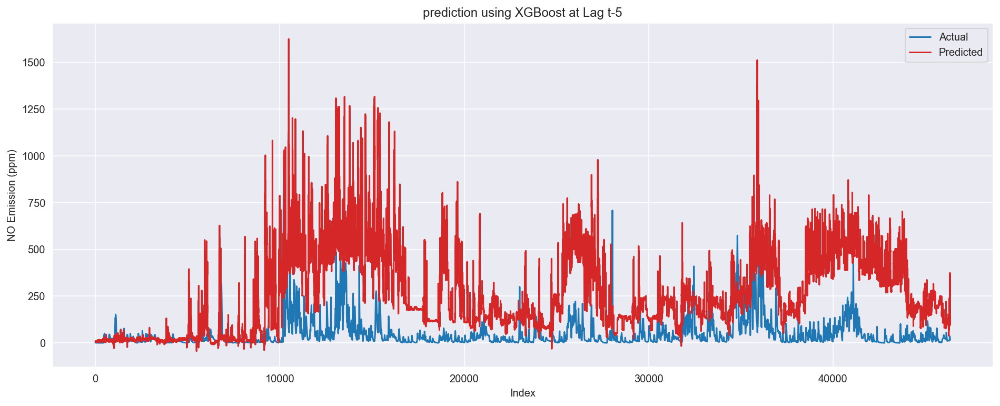

RMSE :  271.4728655140955


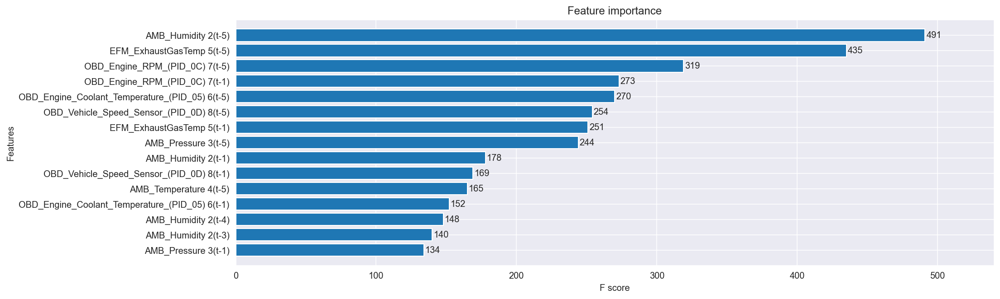

(417152, 54) 417152 (417152,)
(46345, 54)
new_train shape : 48


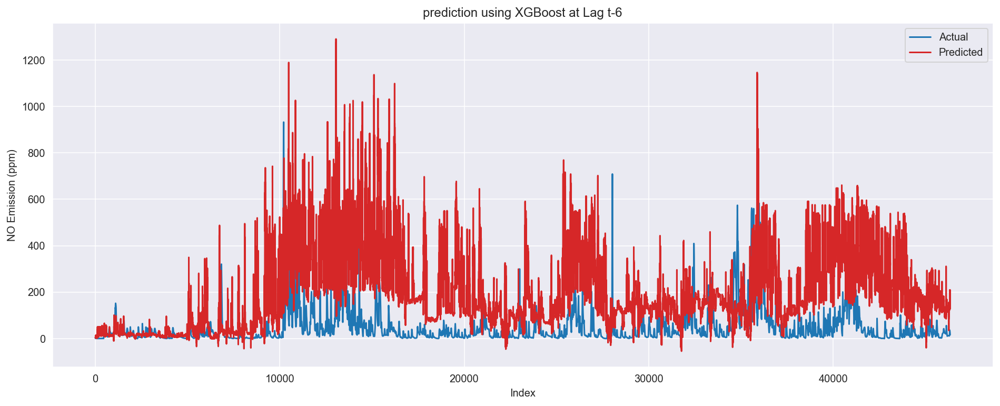

RMSE :  200.2922670858383


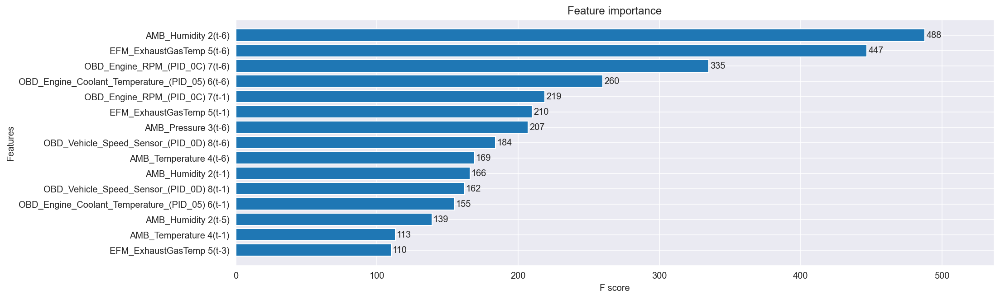

(417152, 63) 417152 (417152,)
(46344, 63)
new_train shape : 56


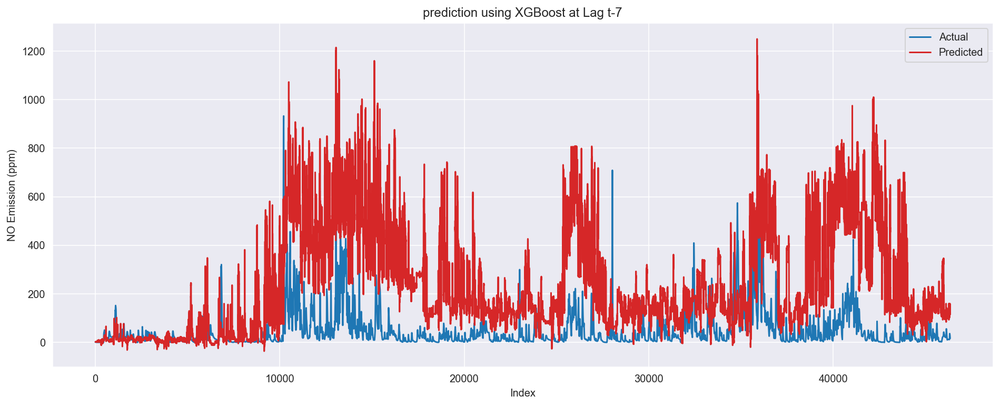

RMSE :  250.57332086687933


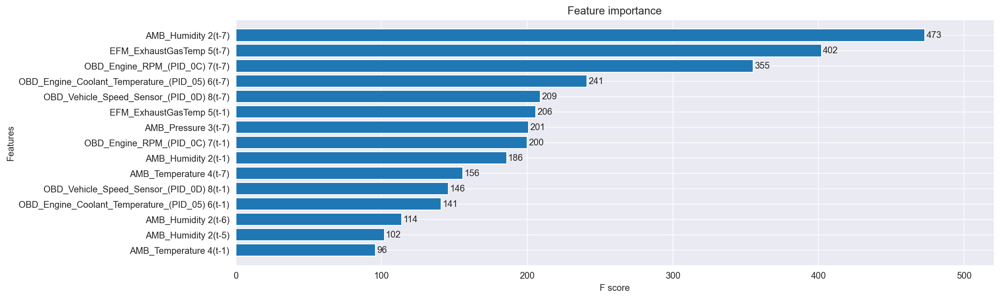

(417152, 72) 417152 (417152,)
(46343, 72)
new_train shape : 64


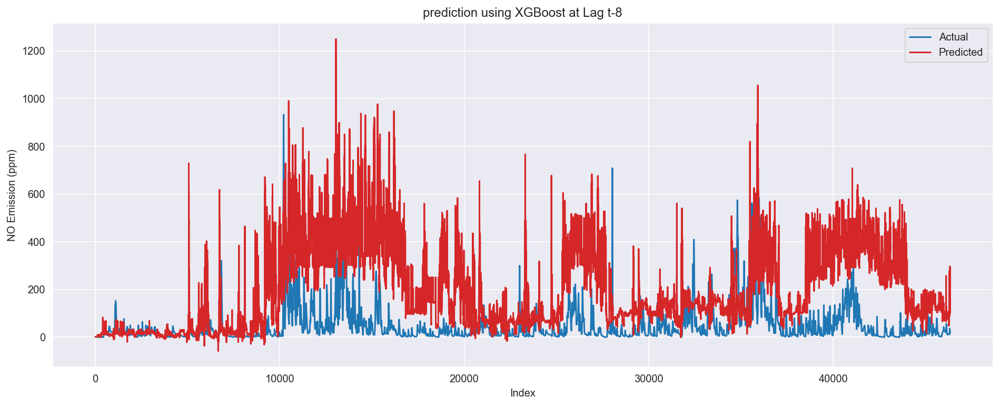

RMSE :  203.58355925549134


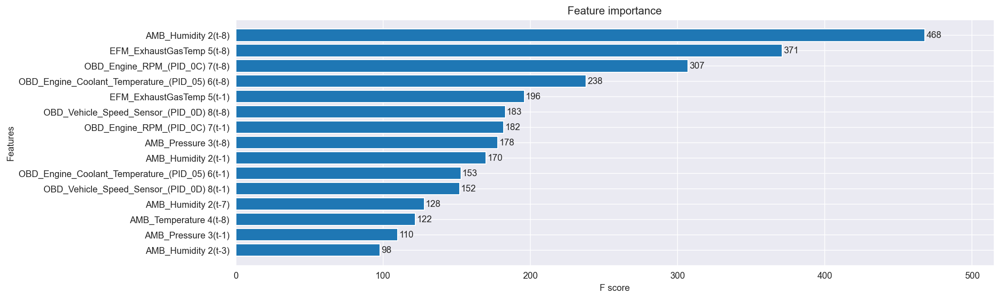

(417152, 81) 417152 (417152,)
(46342, 81)
new_train shape : 72


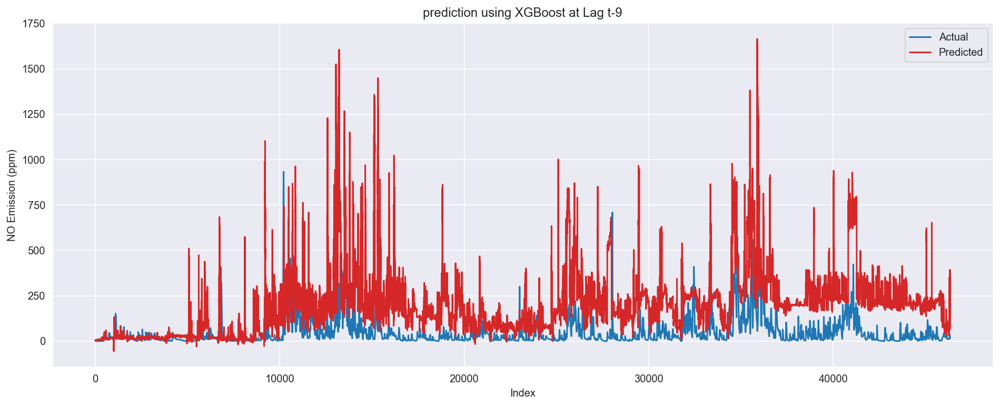

RMSE :  201.10058226671075


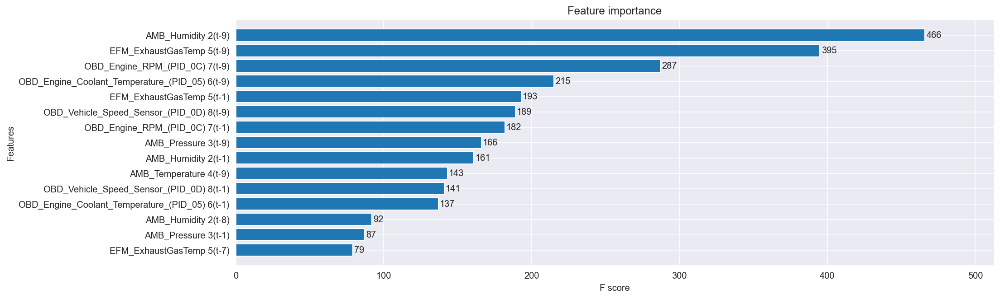

(417152, 90) 417152 (417152,)
(46341, 90)
new_train shape : 80


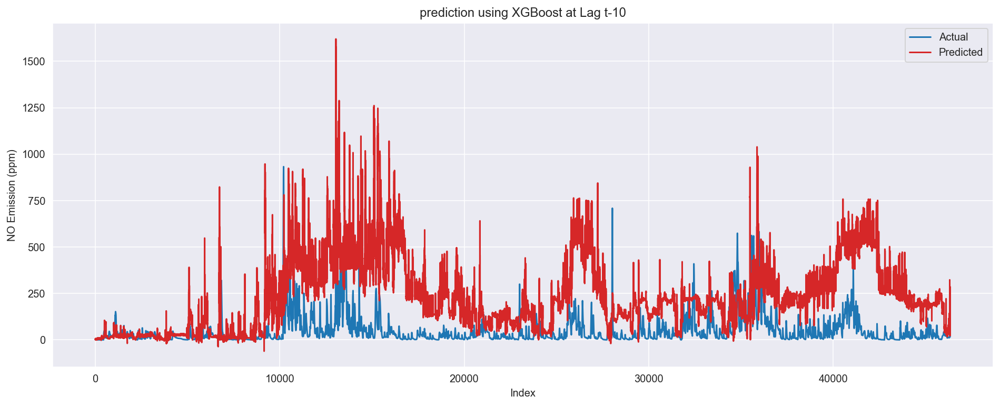

RMSE :  237.0300882253912


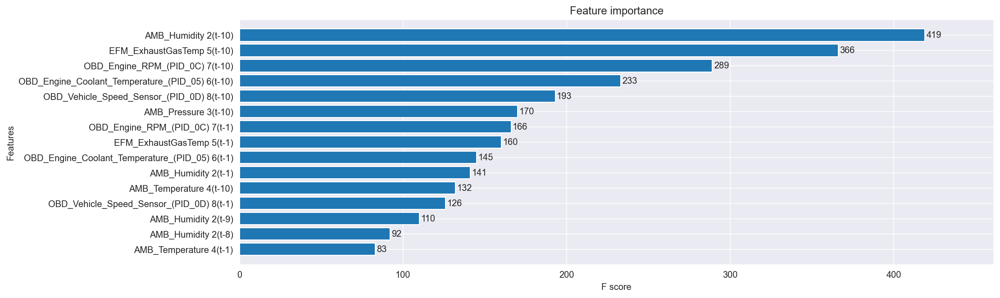

(417152, 99) 417152 (417152,)
(46340, 99)
new_train shape : 88


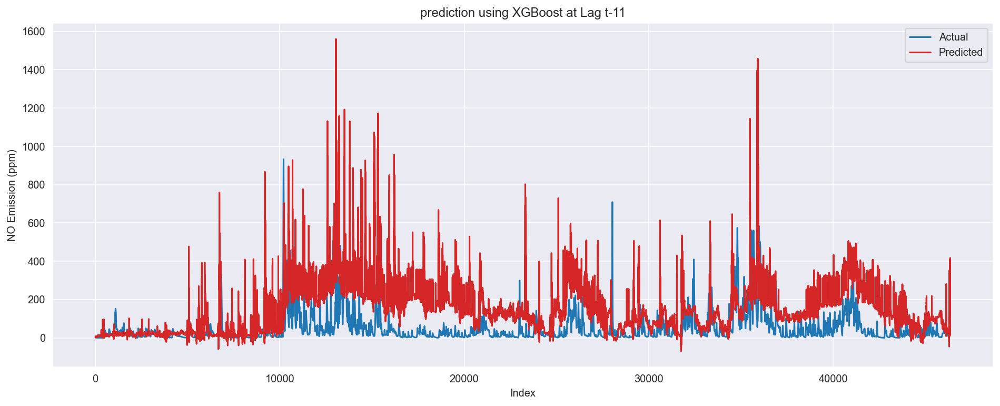

RMSE :  144.89879219613968


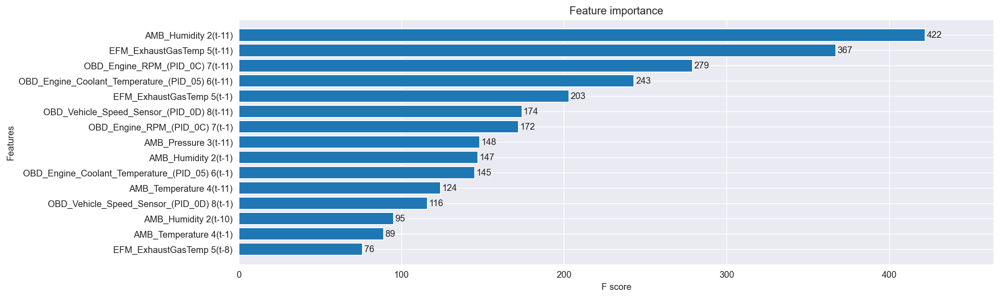

(417152, 108) 417152 (417152,)
(46339, 108)
new_train shape : 96


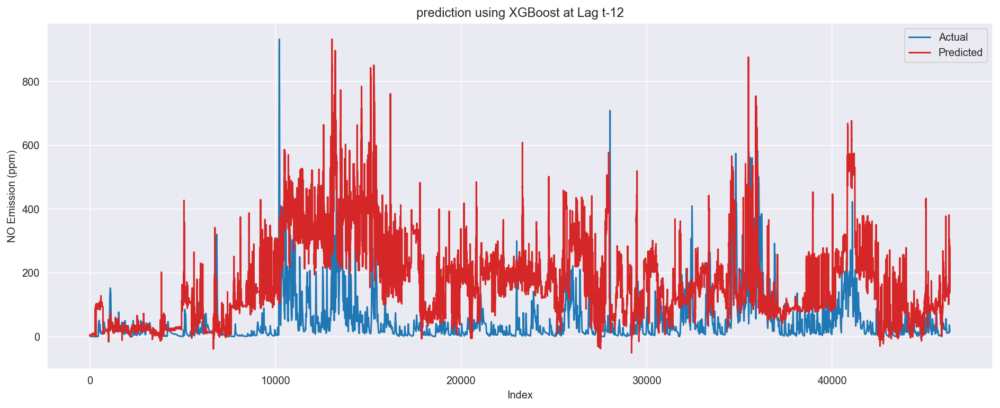

RMSE :  164.0651180134217


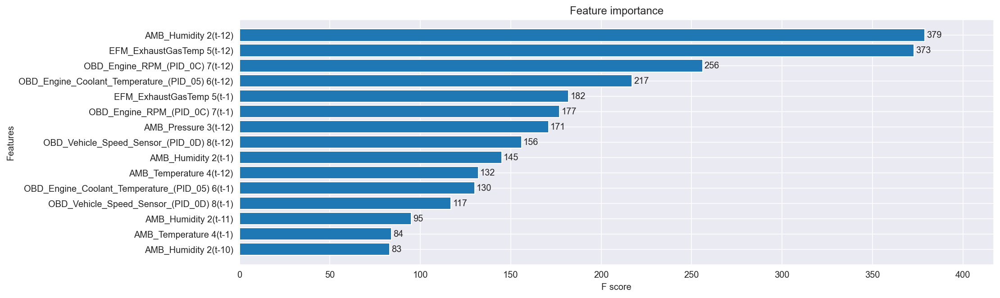

(417152, 117) 417152 (417152,)
(46338, 117)
new_train shape : 104


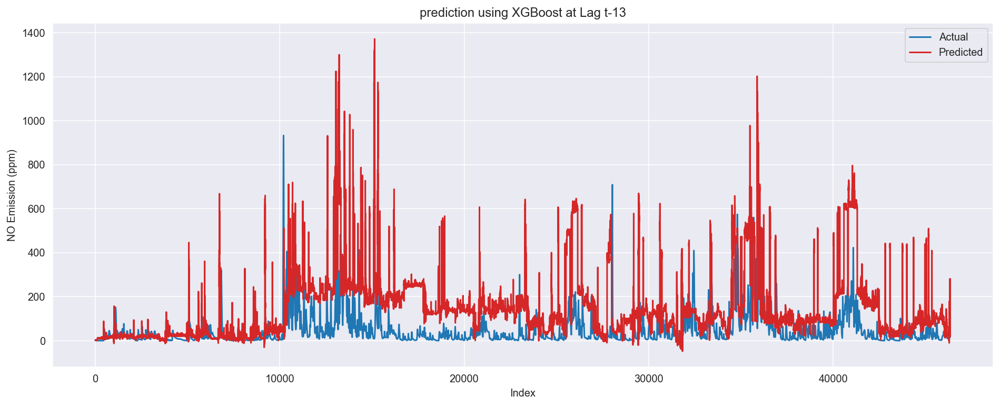

RMSE :  165.40996706001243


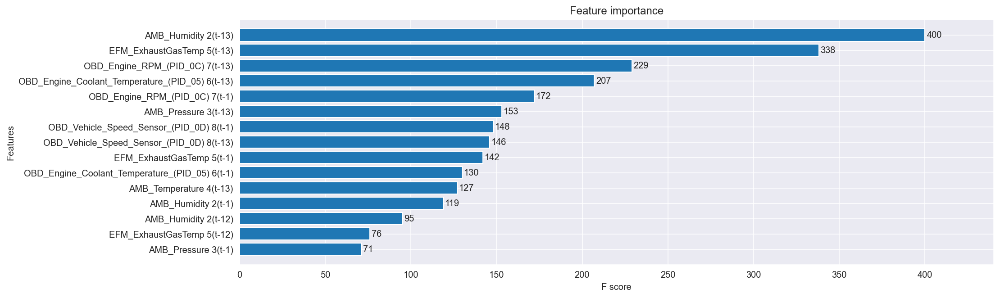

(417152, 126) 417152 (417152,)
(46337, 126)
new_train shape : 112


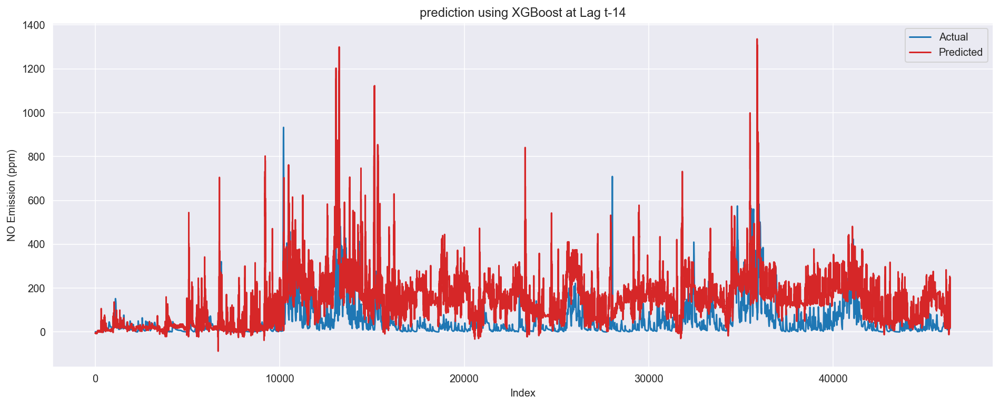

RMSE :  128.68174485220564


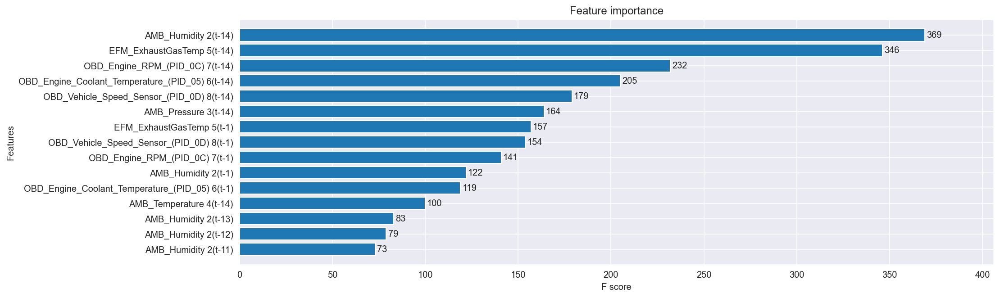

(417152, 135) 417152 (417152,)
(46336, 135)
new_train shape : 120


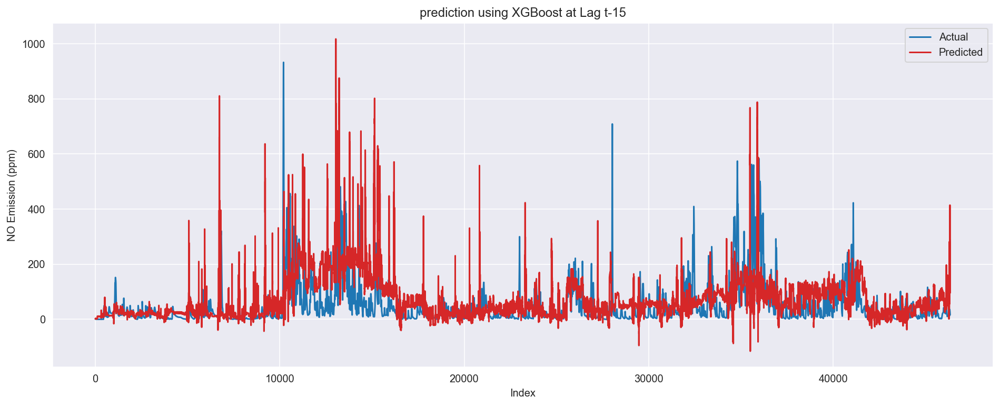

RMSE :  88.19392414992839


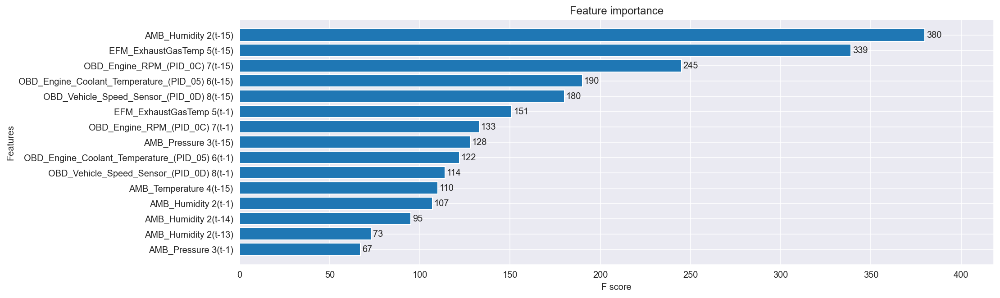

(417152, 144) 417152 (417152,)
(46335, 144)
new_train shape : 128


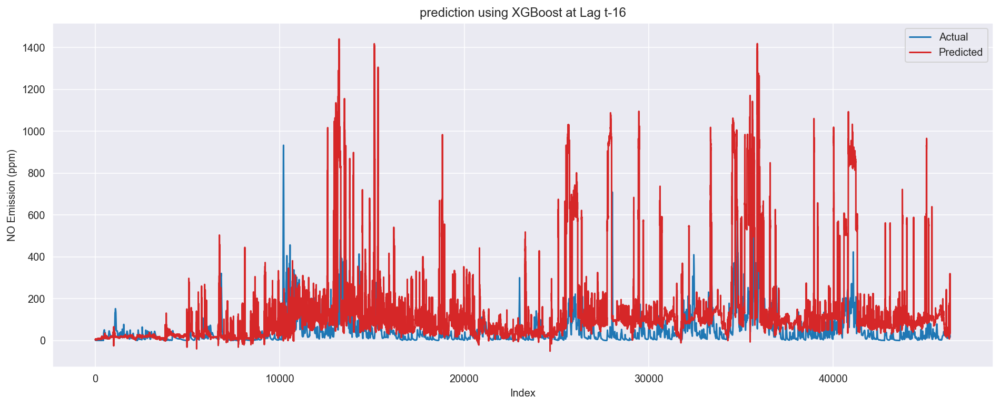

RMSE :  197.57135021152067


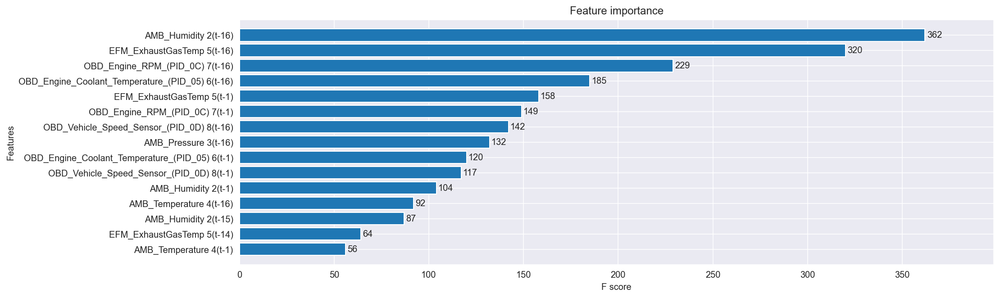

(417152, 153) 417152 (417152,)
(46334, 153)
new_train shape : 136


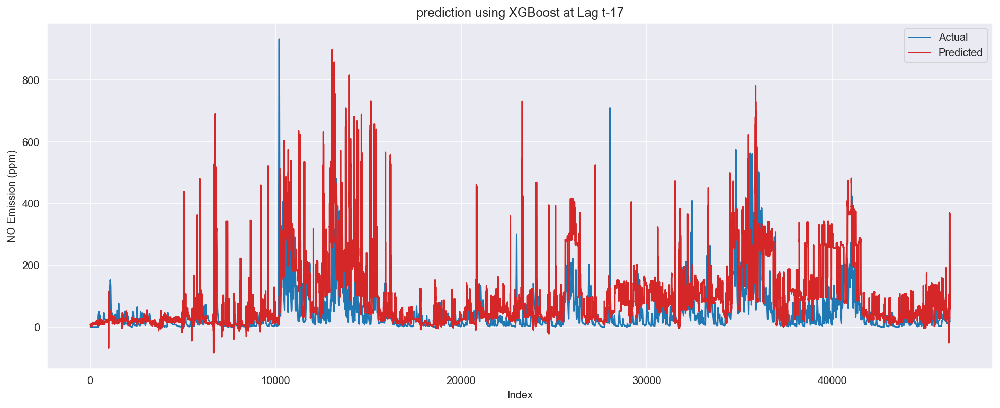

RMSE :  104.51205298279655


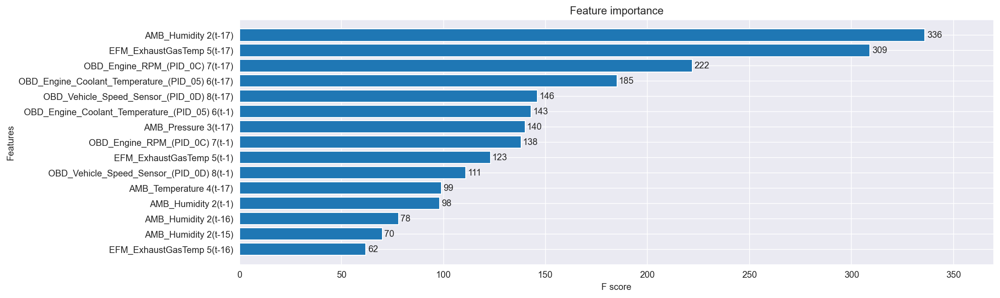

(417152, 162) 417152 (417152,)
(46333, 162)
new_train shape : 144


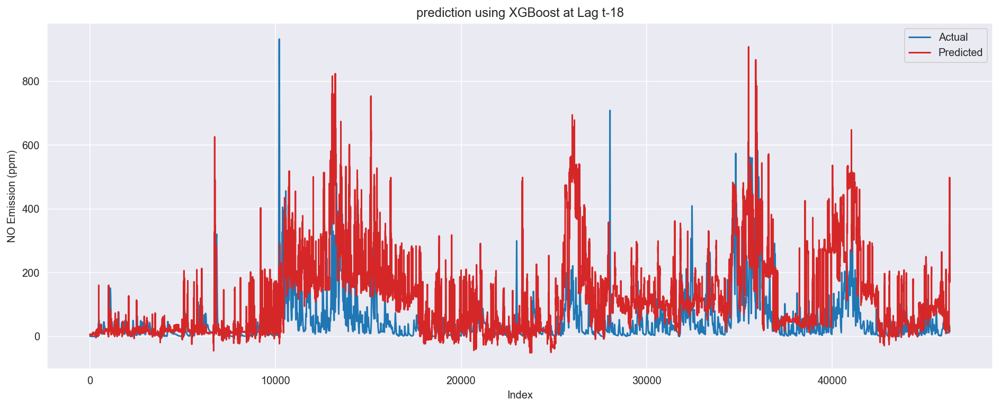

RMSE :  122.85191669408445


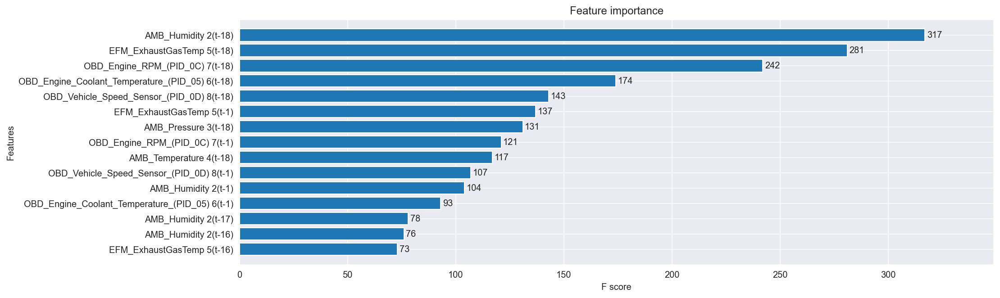

(417152, 171) 417152 (417152,)
(46332, 171)
new_train shape : 152


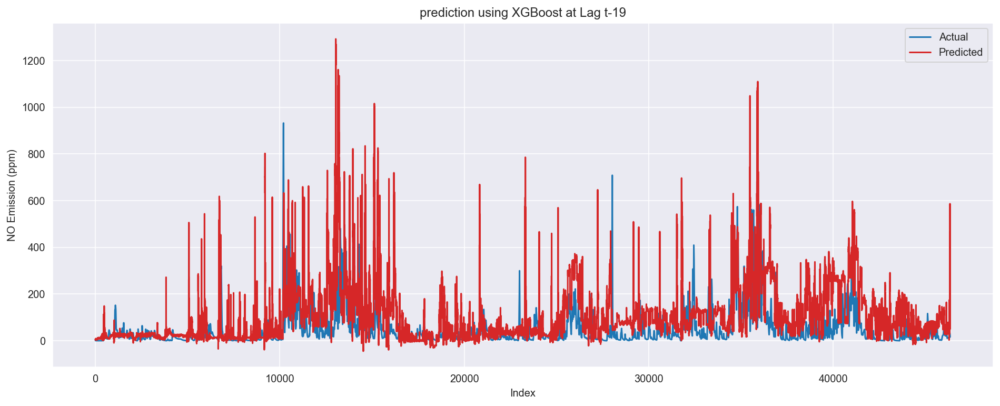

RMSE :  121.74593618729828


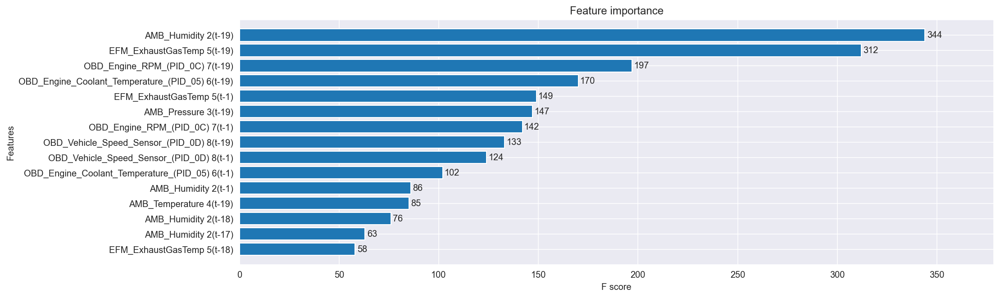

(417152, 180) 417152 (417152,)
(46331, 180)
new_train shape : 160


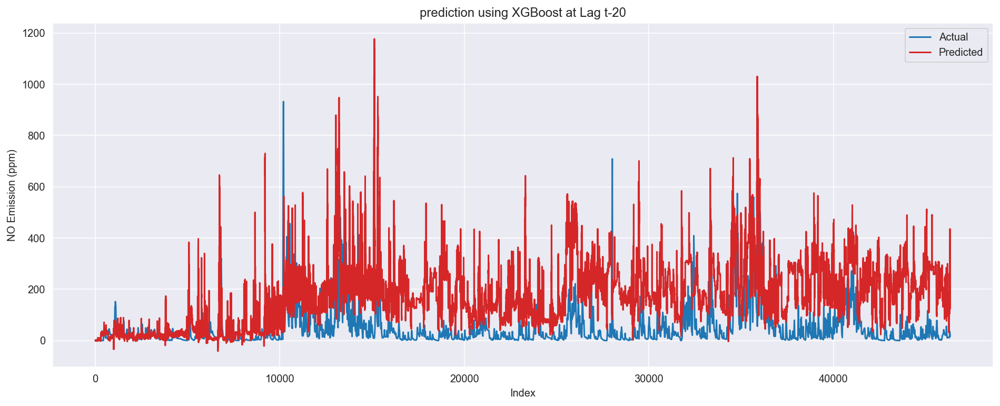

RMSE :  161.08805595257942


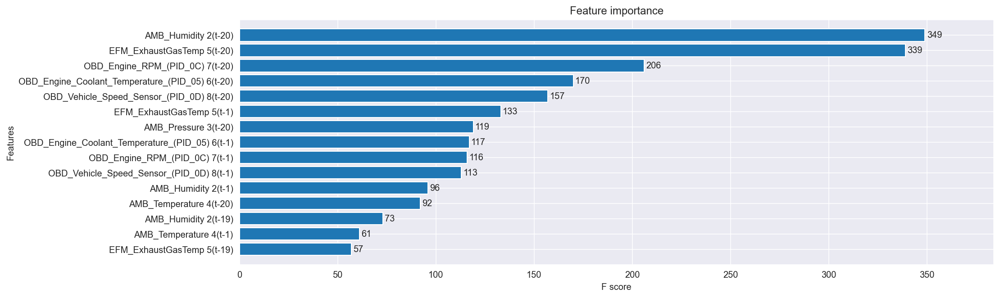

In [19]:
pred_feat_without_nox(20,df)

## Prediction and feature importance WITH NO at different lags

In [20]:
def pred_feat_with_nox(lag,df):
    for i in range(lag):
        n_lag_t = i+1*(np.ones(df.shape[1]))
        n_lag_t = list(map(int, n_lag_t))
        n_features_t = df.shape[1]
        prediction_xgb, MSE['XGB'],test_xgb, model_xgb, train_X,test_X, columns = xgb(df.values, n_lag_t, n_features_t, 0)
        plot(test_xgb, prediction_xgb, 'prediction using XGBoost at Lag t-'+str(i+1));
        print('RMSE : ', np.sqrt(mean_squared_error(prediction_xgb, test_xgb)))
        feat_imp(model_xgb, columns);

(417152, 9) 417152 (417152,)
(46350, 9)
new_train shape : 9


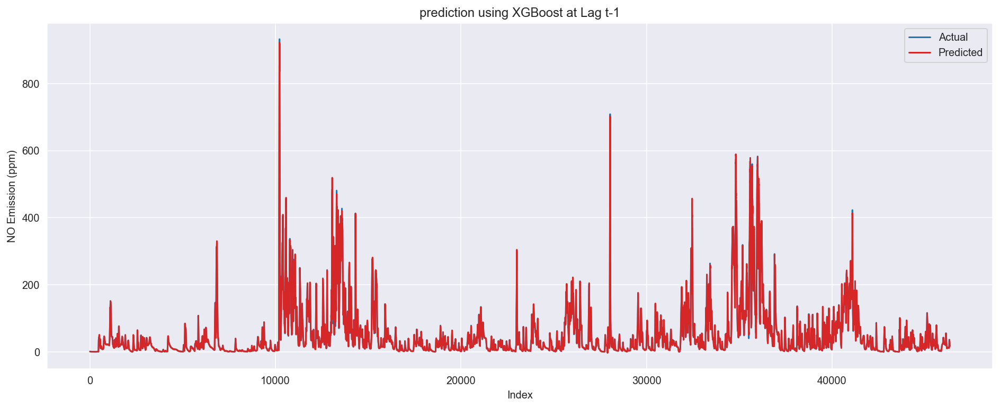

RMSE :  4.12509572777161


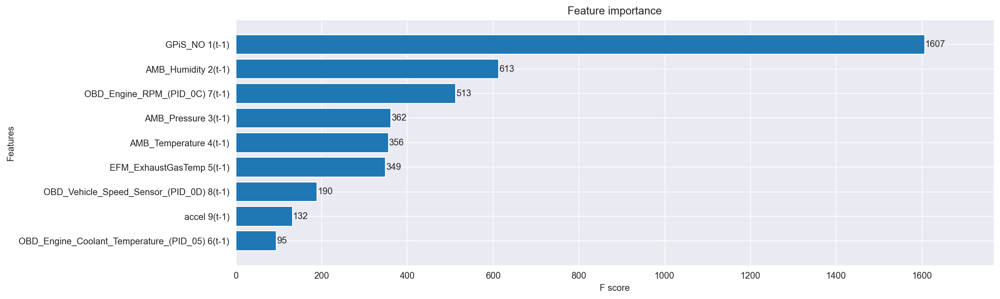

(417152, 18) 417152 (417152,)
(46349, 18)
new_train shape : 18


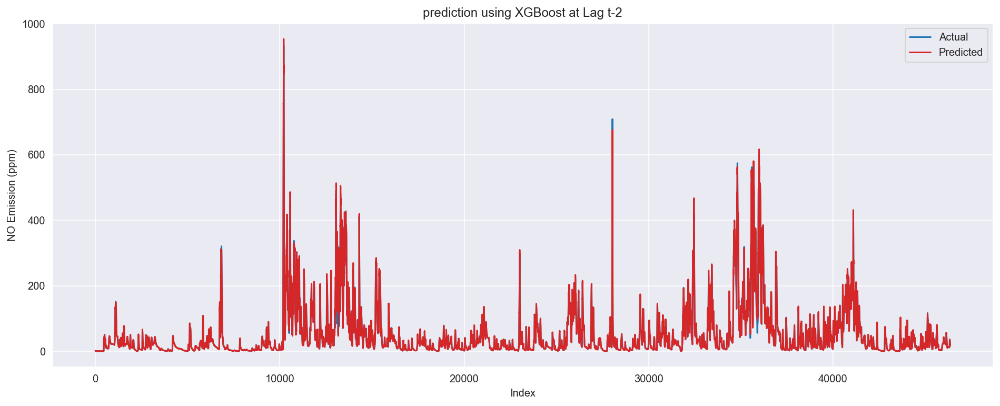

RMSE :  5.48434783871702


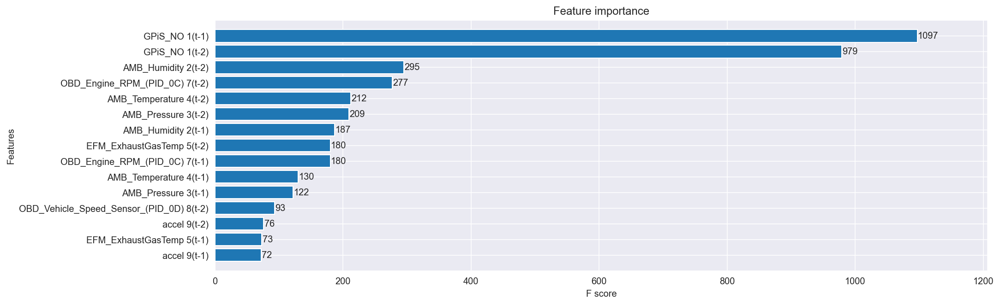

(417152, 27) 417152 (417152,)
(46348, 27)
new_train shape : 27


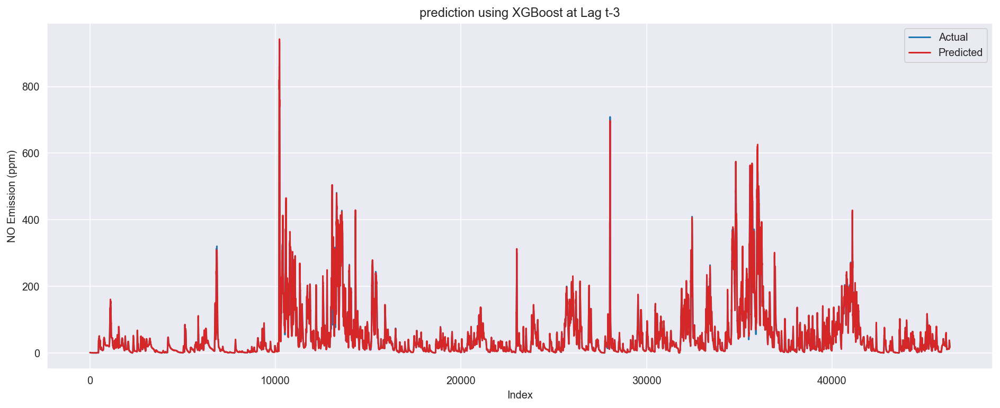

RMSE :  4.387413280424612


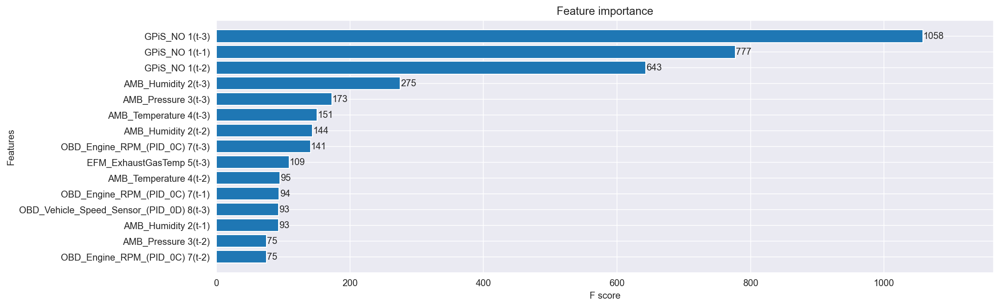

(417152, 36) 417152 (417152,)
(46347, 36)
new_train shape : 36


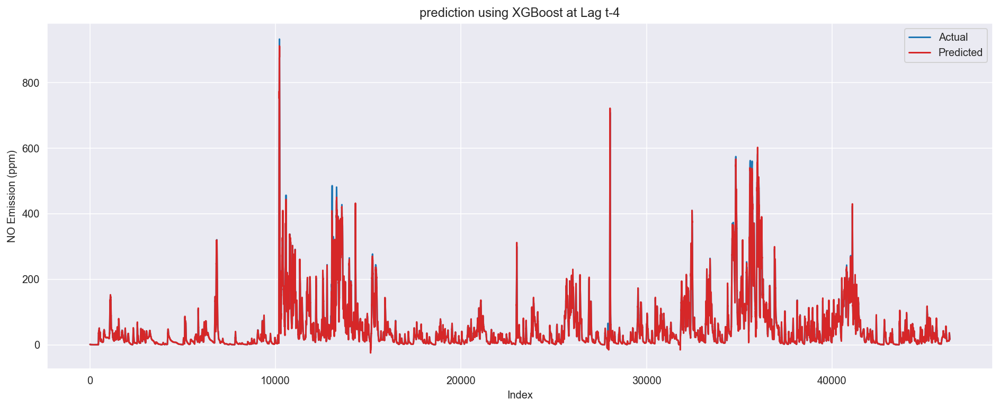

RMSE :  4.639539727295062


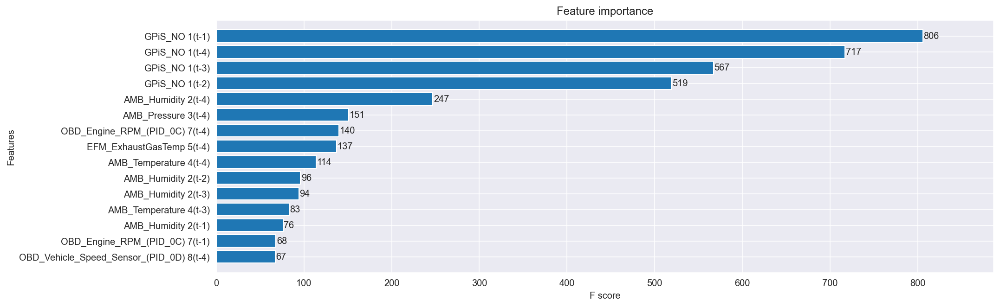

(417152, 45) 417152 (417152,)
(46346, 45)
new_train shape : 45


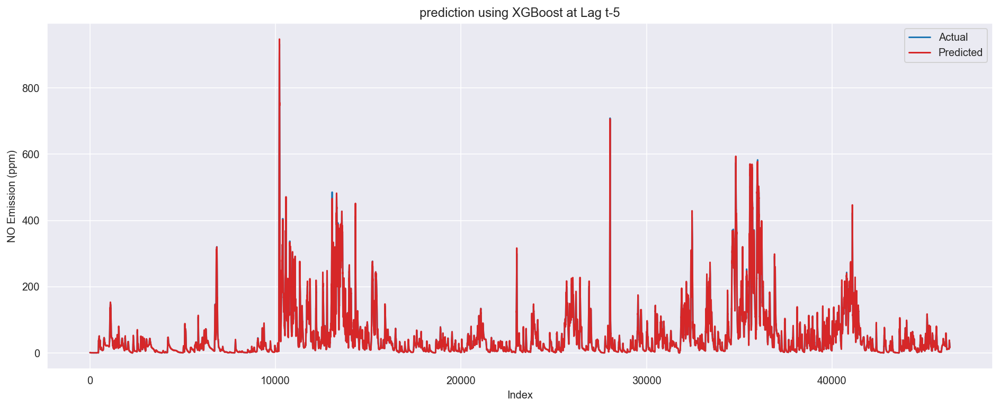

RMSE :  2.881303538974755


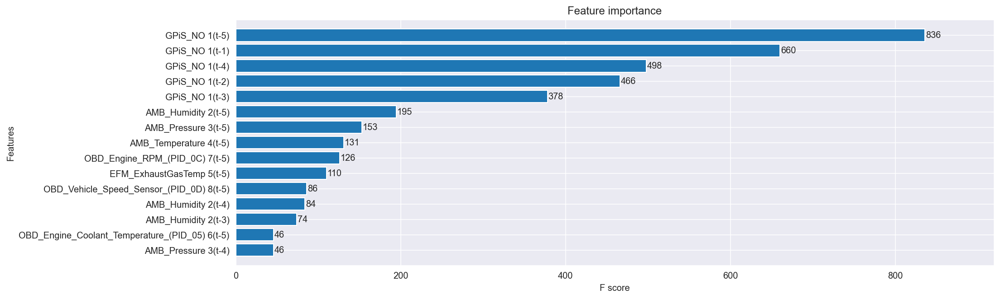

(417152, 54) 417152 (417152,)
(46345, 54)
new_train shape : 54


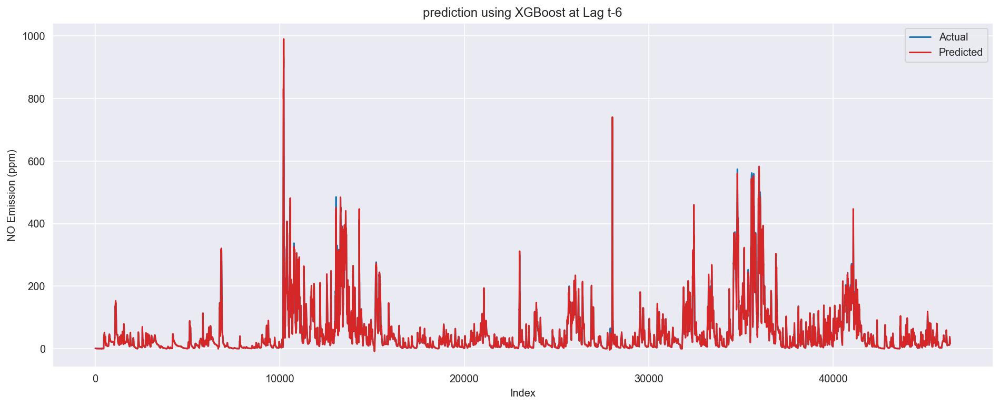

RMSE :  4.068320969180214


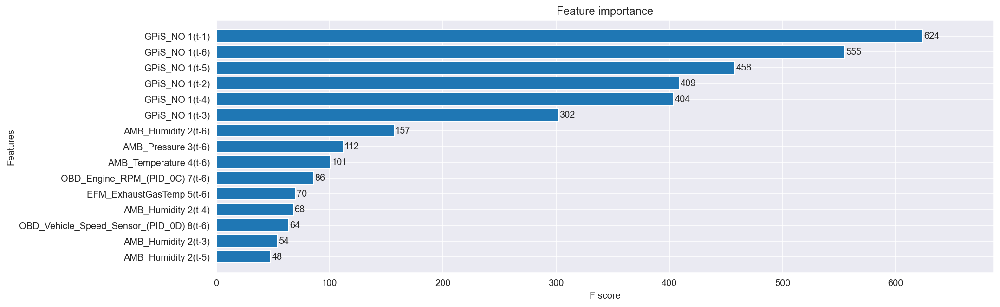

(417152, 63) 417152 (417152,)
(46344, 63)
new_train shape : 63


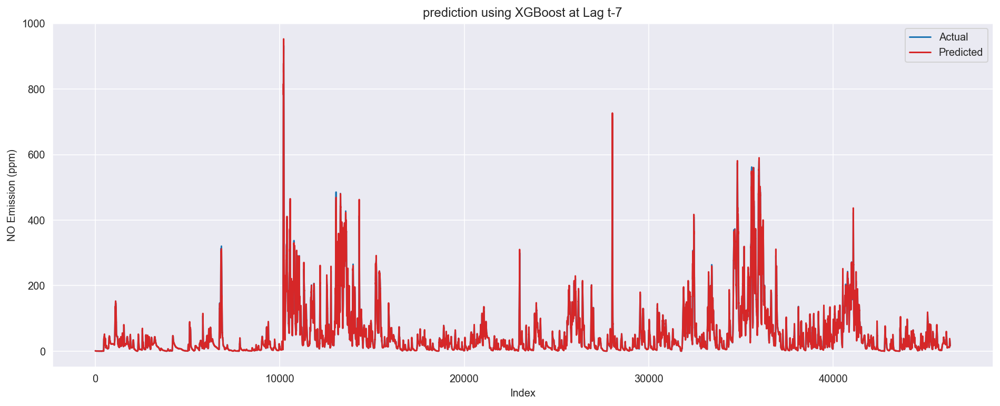

RMSE :  2.868745802053204


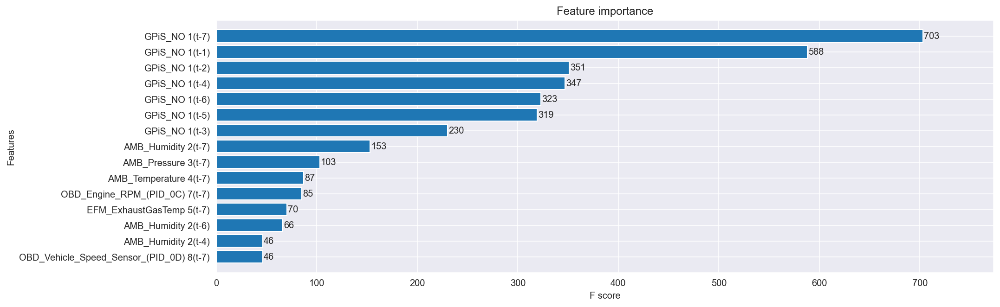

(417152, 72) 417152 (417152,)
(46343, 72)
new_train shape : 72


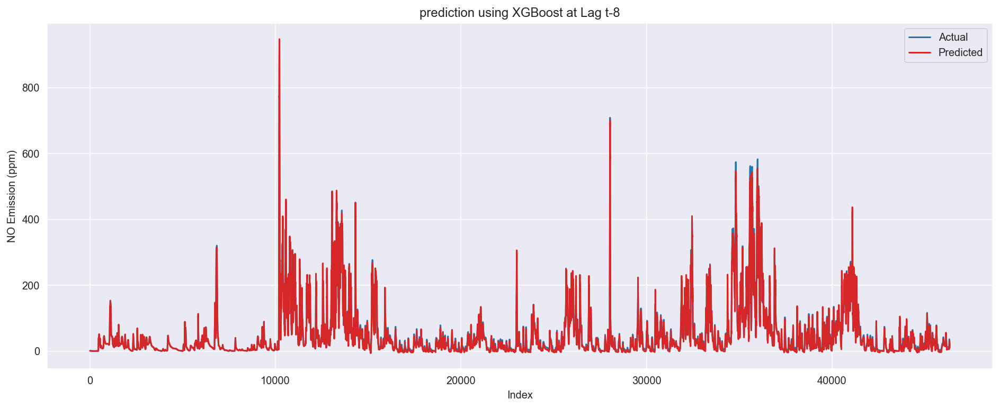

RMSE :  8.933641795232907


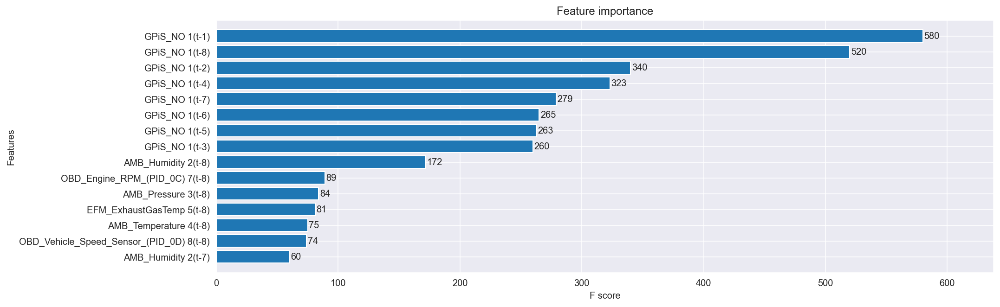

(417152, 81) 417152 (417152,)
(46342, 81)
new_train shape : 81


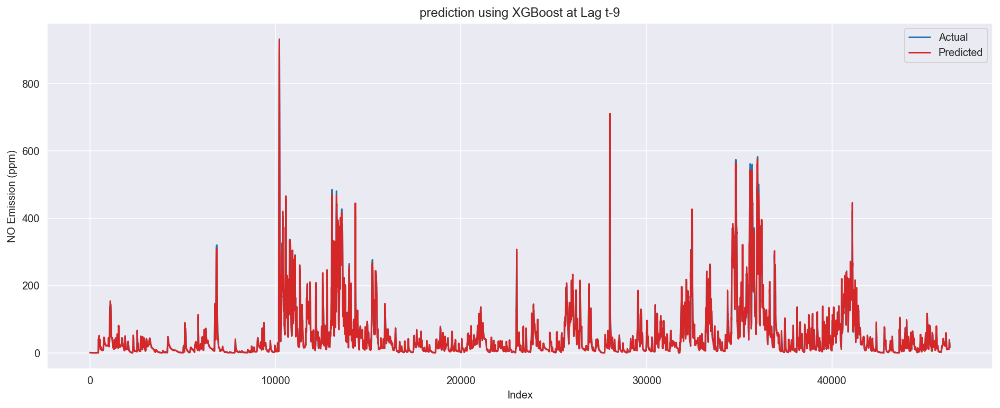

RMSE :  3.357541168409683


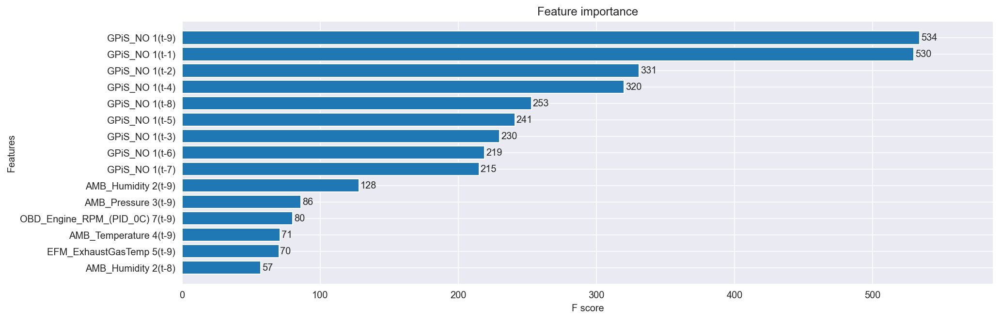

(417152, 90) 417152 (417152,)
(46341, 90)
new_train shape : 90


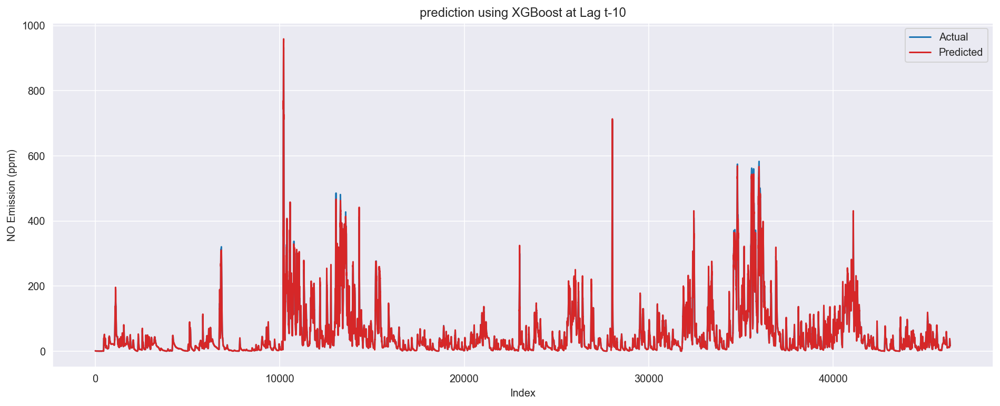

RMSE :  4.250864033905937


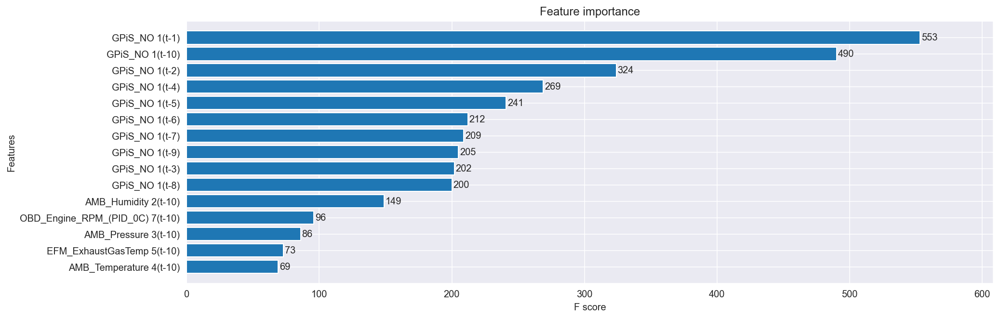

(417152, 99) 417152 (417152,)
(46340, 99)
new_train shape : 99


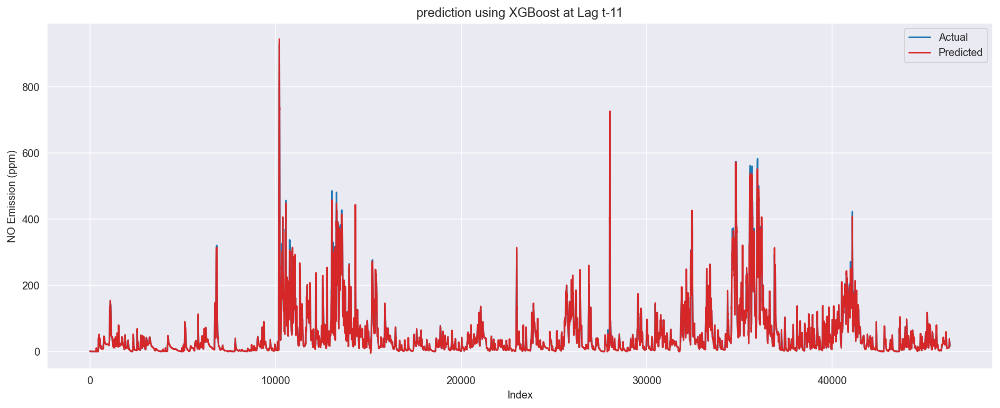

RMSE :  5.443543785836286


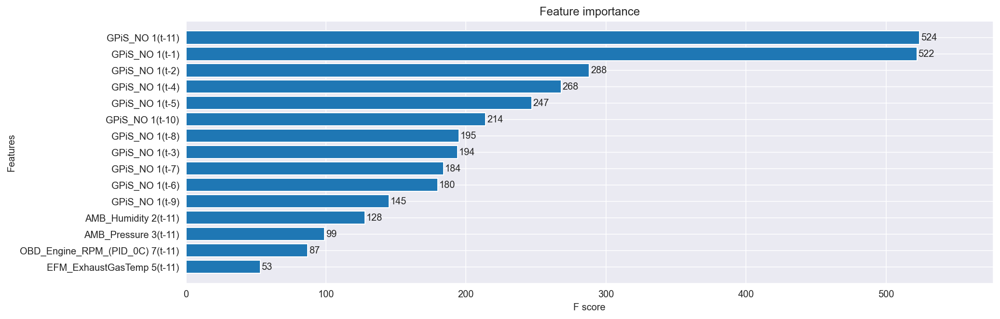

(417152, 108) 417152 (417152,)
(46339, 108)
new_train shape : 108


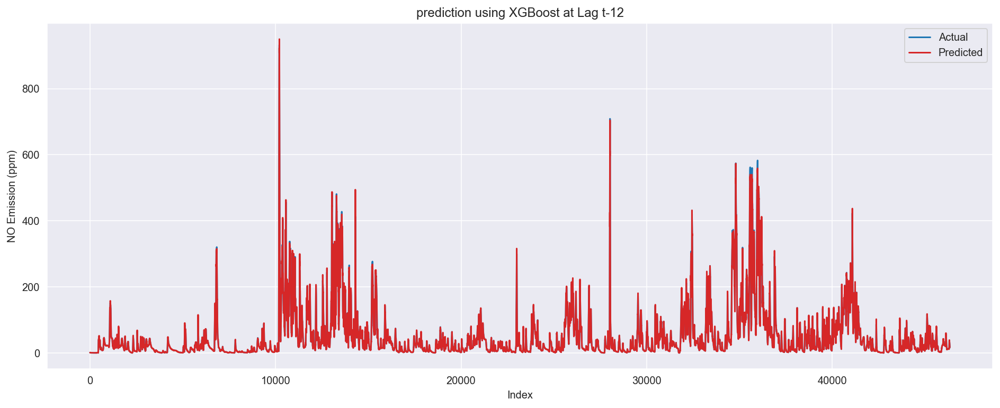

RMSE :  3.086389106068968


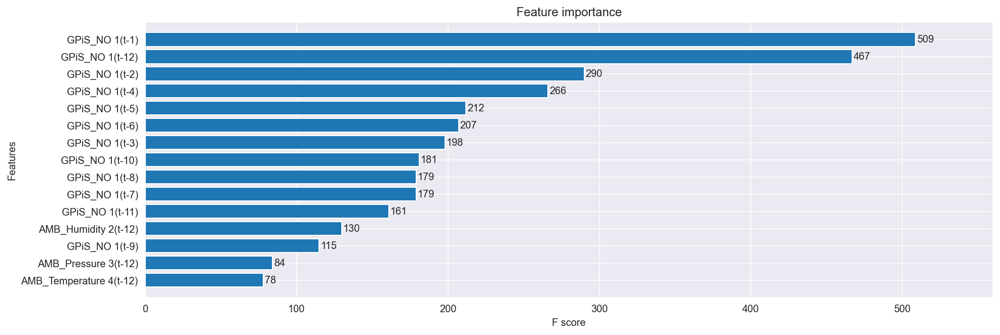

(417152, 117) 417152 (417152,)
(46338, 117)
new_train shape : 117


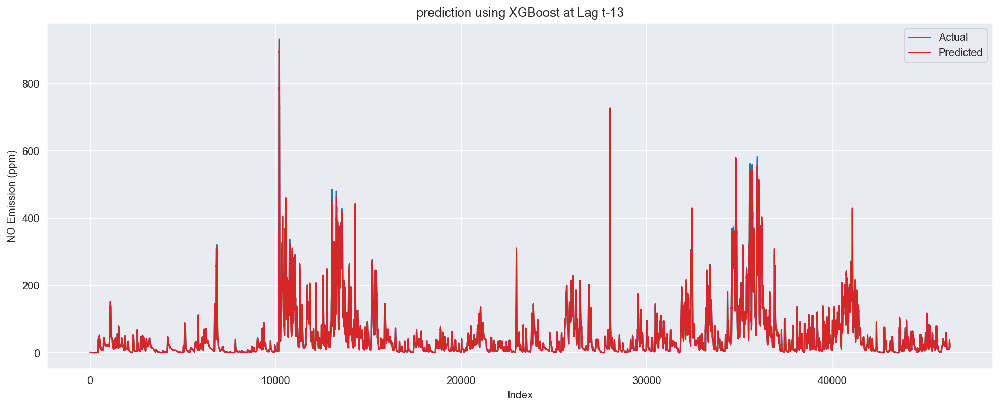

RMSE :  3.2798435689433276


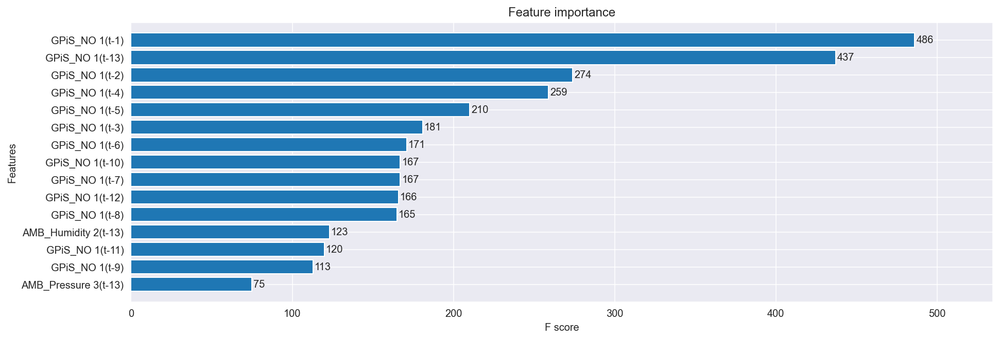

(417152, 126) 417152 (417152,)
(46337, 126)
new_train shape : 126


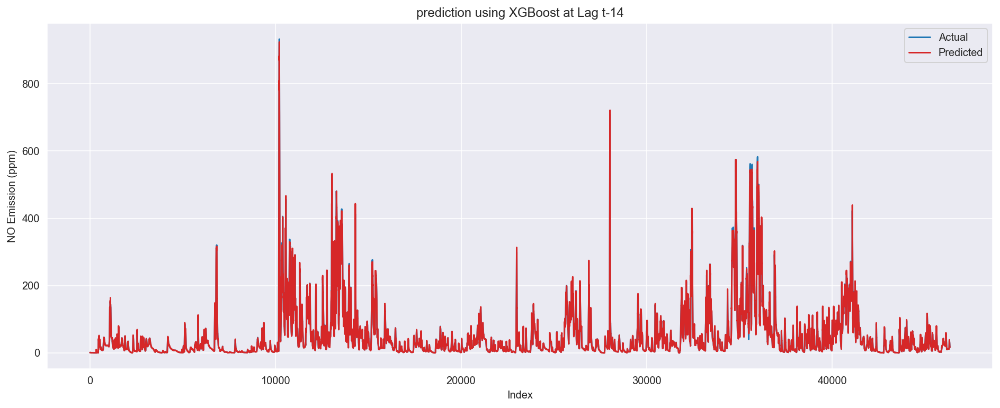

RMSE :  3.344539236916047


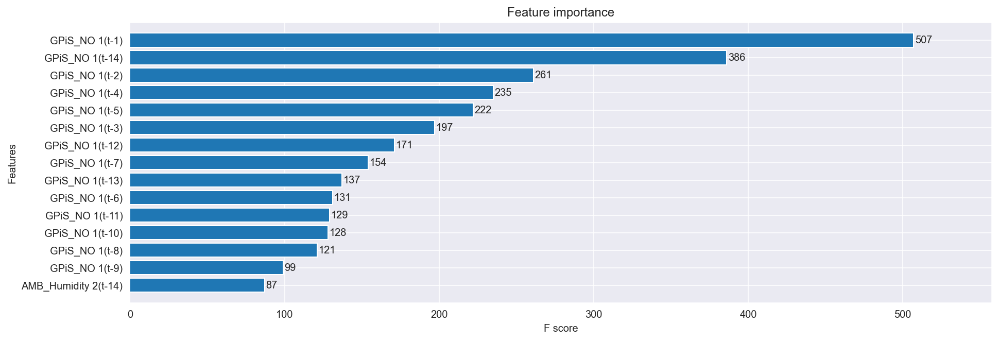

(417152, 135) 417152 (417152,)
(46336, 135)
new_train shape : 135


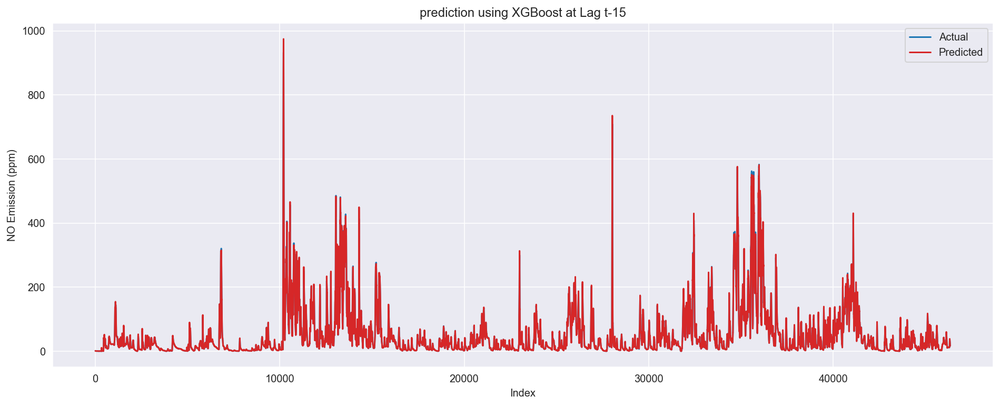

RMSE :  2.7609387673639376


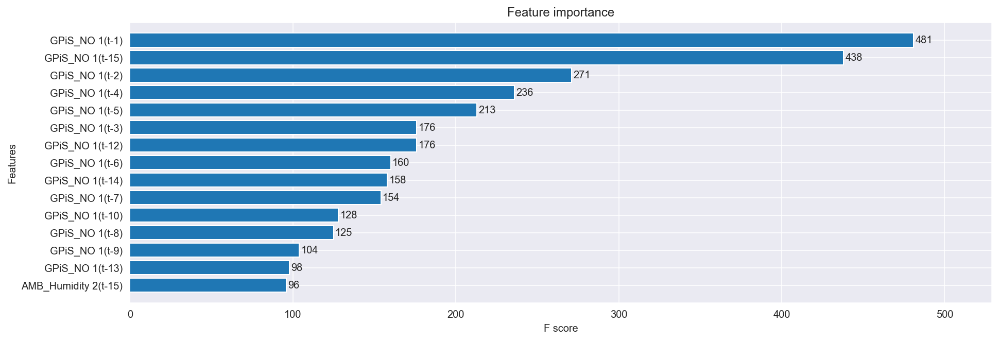

In [21]:
pred_feat_with_nox(15,df)

# Validation on others data

In [22]:
df_others = pd.read_csv(r'C:\Users\u23e00\NOx_prediction\data\raw\others_data.csv')
df_others = df_others.drop('Unnamed: 0', axis=1)
df_others['NOx'] = df_others['GPiS_NO'] + df_others['GPiS_NO2']
df_others

,GPiS_NO,GPiS_NO2,AMB_Humidity,AMB_Pressure,AMB_Temperature,EFM_ExhaustGasTemp,OBD_Engine_Coolant_Temperature_(PID_05),OBD_Engine_RPM_(PID_0C),OBD_Vehicle_Speed_Sensor_(PID_0D),accel,NOx
0,-0.060000,0.189700,49.001908,972.588635,22.011402,24.700001,21.0,0.0,0.0,NaN,0.129700
1,-0.076000,0.187000,49.025788,971.872330,22.011402,24.700001,21.0,0.0,0.0,0.0,0.111000
2,-0.081500,0.185900,49.001908,972.111082,22.011402,24.700001,21.0,0.0,0.0,0.0,0.104400
3,-0.094000,0.183400,48.978033,972.111082,22.011402,24.700001,21.0,0.0,0.0,0.0,0.089400
4,-0.129380,0.182220,48.978033,972.111082,22.011402,24.700001,21.0,0.0,0.0,0.0,0.052840
...,...,...,...,...,...,...,...,...,...,...,...
227178,-1.831735,6.136540,76.198182,960.000000,22.500000,80.199997,96.0,0.0,0.0,0.0,4.304805
227179,-1.826235,6.134540,76.198182,960.000000,22.500000,77.199997,96.0,0.0,0.0,0.0,4.308305
227180,-1.820620,6.132425,76.198182,960.000000,22.500000,77.199997,96.0,0.0,0.0,0.0,4.311805
227181,-1.814620,6.129925,76.198182,960.000000,22.500000,77.199997,96.0,0.0,0.0,0.0,4.315305


In [23]:
channels_model = ['GPiS_NO','AMB_Humidity', 'AMB_Pressure', 'AMB_Temperature','EFM_ExhaustGasTemp','OBD_Engine_Coolant_Temperature_(PID_05)',
                  'OBD_Engine_RPM_(PID_0C)','OBD_Vehicle_Speed_Sensor_(PID_0D)','accel']

In [24]:
df_others = df_others[channels_model].dropna()
df_others = df_others[df_others['OBD_Engine_Coolant_Temperature_(PID_05)']>0]
df_others = df_others[(df_others['GPiS_NO']<2500) &(df_others['GPiS_NO']>0)]
df_others

,GPiS_NO,AMB_Humidity,AMB_Pressure,AMB_Temperature,EFM_ExhaustGasTemp,OBD_Engine_Coolant_Temperature_(PID_05),OBD_Engine_RPM_(PID_0C),OBD_Vehicle_Speed_Sensor_(PID_0D),accel
17,0.550720,49.001908,971.872330,22.040058,24.700001,21.0,0.0,0.0,0.0
18,1.451000,49.025788,971.872330,22.011402,24.700001,21.0,0.0,0.0,0.0
19,2.351000,49.001908,971.633577,22.011402,24.700001,21.0,0.0,0.0,0.0
20,3.503500,48.978033,971.633577,21.982752,24.700001,21.0,0.0,0.0,0.0
21,4.656000,49.001908,972.111082,22.011402,24.700001,21.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
227093,0.378000,76.317568,960.000000,22.500000,81.199997,96.0,0.0,0.0,0.0
227094,0.356150,76.245933,960.000000,22.500000,81.199997,96.0,0.0,0.0,0.0
227095,0.261150,76.245933,960.000000,22.500000,81.199997,96.0,0.0,0.0,0.0
227096,0.166265,76.269813,960.000000,22.500000,81.199997,96.0,0.0,0.0,0.0


In [25]:
pred, MSE['XGB'],test, model,train_X1,test_X1, columns = xgb(df_others.dropna().values, n_lag, n_features,0)

(196886, 90) 196886 (196886,)
(21867, 90)
new_train shape : 90


In [26]:
prediction = model_xgb.predict(test_X1)

ValueError: feature_names mismatch: ['f0', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f20', 'f21', 'f22', 'f23', 'f24', 'f25', 'f26', 'f27', 'f28', 'f29', 'f30', 'f31', 'f32', 'f33', 'f34', 'f35', 'f36', 'f37', 'f38', 'f39', 'f40', 'f41', 'f42', 'f43', 'f44'] ['f0', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f20', 'f21', 'f22', 'f23', 'f24', 'f25', 'f26', 'f27', 'f28', 'f29', 'f30', 'f31', 'f32', 'f33', 'f34', 'f35', 'f36', 'f37', 'f38', 'f39', 'f40', 'f41', 'f42', 'f43', 'f44', 'f45', 'f46', 'f47', 'f48', 'f49', 'f50', 'f51', 'f52', 'f53', 'f54', 'f55', 'f56', 'f57', 'f58', 'f59', 'f60', 'f61', 'f62', 'f63', 'f64', 'f65', 'f66', 'f67', 'f68', 'f69', 'f70', 'f71', 'f72', 'f73', 'f74', 'f75', 'f76', 'f77', 'f78', 'f79', 'f80', 'f81', 'f82', 'f83', 'f84', 'f85', 'f86', 'f87', 'f88', 'f89']
training data did not have the following fields: f46, f76, f64, f67, f78, f79, f80, f66, f49, f89, f63, f60, f74, f77, f54, f87, f73, f82, f72, f69, f51, f85, f84, f75, f70, f50, f48, f65, f57, f86, f62, f52, f47, f71, f81, f83, f88, f45, f58, f68, f53, f55, f61, f56, f59

In [ ]:
plot(test, prediction, 'XGB')

In [ ]:
np.sqrt(mean_squared_error(pred, test))

In [ ]:
plot(test[18000:20000], prediction[18000:20000], 'XGB')

In [40]:
# import joblib
# #save model
# joblib.dump(model_xgb_l5, 'xgb_model_lag5') 

# #load saved model
# xgb = joblib.load('xgb_model')

['xgb_model_lag5']

In [ ]:
from xgboost import plot_importance
# plot feature importance
model_xgb.get_booster().feature_names = columns
plt.figure(figsize=(15,9))
plot_importance(model_xgb, max_num_features = 25, color='C3');

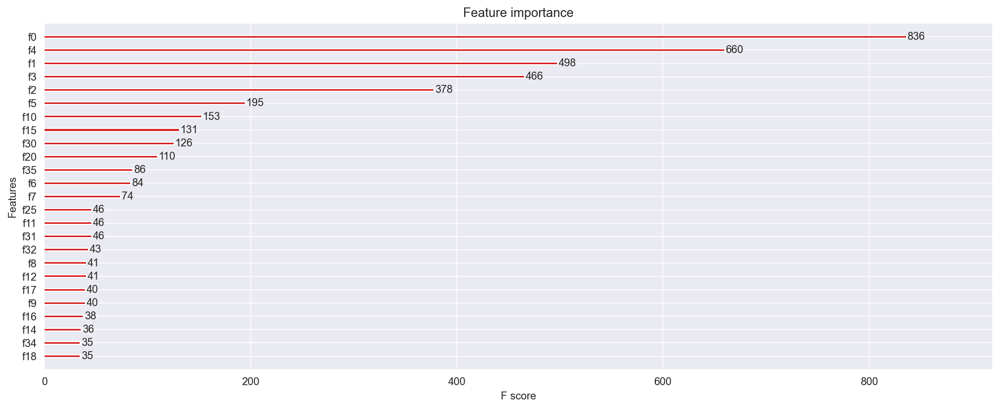

In [41]:
plot_importance(model_xgb_l5, max_num_features = 25, color='C3');